### Sample program for Reinforcement Learning with OpenAI Gym and Keras-rl2 

#### Parameters  

In [1]:
max_steps_per_episode = 200
ENV_NAME = 'CartPole-v1'

# List of environments in Gym   
# https://github.com/openai/gym/wiki/Table-of-environments
# https://gym.openai.com/envs/#classic_control

import  os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

#### Import libraries  

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import gym
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

#### === Scripts to show movement without training ===  

#### Functions to make animation  

In [3]:
def display_frames_as_gif(frames):
    dpi = 200
    fig = plt.figure(figsize=(frames[0].shape[1]/dpi, frames[0].shape[0]/dpi),
                     dpi=dpi)
    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = FuncAnimation(plt.gcf(), animate, frames=len(frames),
                         interval=10, repeat=False)
    print('Saving images into an animation gif file ...')
    anim.save('movie_{}_random.gif'.format(ENV_NAME), writer='pillow')
    print('Done.')
    return anim

#### Random movement  

In [4]:
frames = []
n_trials = 5
env = gym.make(ENV_NAME)

for i in range(n_trials):
    observation = env.reset()  # Reset environment first

    for _ in range(max_steps_per_episode):
        frames.append(env.render(mode='rgb_array'))  # add a snapshot image to frames
        action = np.random.choice(2)  # 0: Push to left, 1: Push to right
        observation, reward, done, info = env.step(action)  # exec an action
    
env.close()

/home/anhvu/miniconda3/envs/ds21/lib/python3.9/site-packages/gym/logger.py:34: UserWarning: WARN: You are calling 'step()' even though this environment has already returned done = True. You should always call 'reset()' once you receive 'done = True' -- any further steps are undefined behavior.
  warnings.warn(colorize("%s: %s" % ("WARN", msg % args), "yellow"))


#### Save (into gif) and show the movement  

In [5]:
%%capture
plt.rcParams["animation.html"] = "jshtml"

%time an = display_frames_as_gif(frames)
ret = an.to_jshtml()

In [6]:
HTML(ret)  # should be placed in another cell

#### === Scripts to show movement with training ===  

#### Import libraries  

In [7]:
import rl.callbacks
import time

2021-12-15 20:09:30.345702: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-12-15 20:09:30.345747: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


#### Class to get animation data during training (learning)  

In [8]:
class ViewLogger(rl.callbacks.Callback):
    def __init__(self):
        self.frames = []

    def on_action_end(self, action, logs):
        self.frames.append(self.env.render(mode='rgb_array'))

    def view(self, interval=5, start_frame=0, end_frame=0):
        assert start_frame<len(self.frames)
        self.start_frame = start_frame
        if end_frame == 0 or end_frame > len(self.frames):
            end_frame = len(self.frames)
        self.t0 = time.time()

        # display sizes
        plt.figure(figsize=(2.5,2.5), dpi=200)

        self.patch = plt.imshow(self.frames[0])
        plt.axis('off')

        anim = FuncAnimation(plt.gcf(), self._plot,
                             frames=end_frame-start_frame, interval=interval,
                             repeat=False)
        print('Saving images into an animation gif file ...')
        anim.save('movie_{}.gif'.format(ENV_NAME), writer='pillow')
        print('Done.')
        return anim.to_jshtml()

    def _plot(self, frame):
        if frame % max_steps_per_episode == 0:
            print("{}f {}m".format(frame, (time.time()-self.t0)/60))
        self.patch.set_data(self.frames[frame+self.start_frame])

#### Reinforcement learning using DQN  

#### Import libraries  

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

from rl.agents.dqn import DQNAgent
from rl.policy import EpsGreedyQPolicy
from rl.memory import SequentialMemory

#### Parameters  

In [10]:
np.random.seed(111)
env.seed(111)

[111]

In [11]:
env = gym.make(ENV_NAME)
nb_actions = env.action_space.n
nb_observ = env.observation_space.shape
print('Number of dimensions for observation:', nb_observ)
print('Number of dimensions for action:', nb_actions)

Number of dimensions for observation: (4,)
Number of dimensions for action: 2


#### Build a very simple model for reinforcement learning  

In [12]:
model = Sequential()
model.add(Flatten(input_shape=(1,) + nb_observ))
model.add(Dense(32, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(nb_actions, activation='linear'))

print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 4)                 0         
_________________________________________________________________
dense (Dense)                (None, 32)                160       
_________________________________________________________________
dense_1 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 66        
Total params: 2,338
Trainable params: 2,338
Non-trainable params: 0
_________________________________________________________________
None


#### Definition for the Agent by DQN  

In [13]:
memory = SequentialMemory(limit=50000, window_length=1)
policy = EpsGreedyQPolicy()
dqn = DQNAgent(model=model, nb_actions=nb_actions, memory=memory, nb_steps_warmup=10,
               target_model_update=1e-2, policy=policy)
dqn.compile(Adam(lr=1e-3), metrics=['mae'])

/home/anhvu/.local/lib/python3.9/site-packages/keras/optimizer_v2/optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(
2021-12-15 20:09:32.816893: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2021-12-15 20:09:32.816959: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2021-12-15 20:09:32.816991: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (anhvu): /proc/driver/nvidia/version does not exist
2021-12-15 20:09:32.817719: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in othe

#### Execute training (learning)  

In [14]:
%%time

# If visualization is set to True, animation during the training can be seen.
# But this slows down training quite a lot
fit_log = dqn.fit(env, nb_steps=50000, visualize=False, verbose=1)
#fit_log = dqn.fit(env, nb_steps=50000, visualize=True, verbose=1)

Training for 50000 steps ...
Interval 1 (0 steps performed)
    1/10000 [..............................] - ETA: 10:20 - reward: 1.0000

/home/anhvu/.local/lib/python3.9/site-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '
/home/anhvu/.local/lib/python3.9/site-packages/rl/memory.py:37: UserWarning: Not enough entries to sample without replacement. Consider increasing your warm-up phase to avoid oversampling!
  warnings.warn('Not enough entries to sample without replacement. Consider increasing your warm-up phase to avoid oversampling!')


10000/10000 [==============================] - 55s 5ms/step - reward: 1.0000
116 episodes - episode_reward: 85.078 [8.000, 191.000] - loss: 0.420 - mae: 17.274 - mean_q: 34.753

Interval 2 (10000 steps performed)
10000/10000 [==============================] - 54s 5ms/step - reward: 1.0000
64 episodes - episode_reward: 157.812 [131.000, 216.000] - loss: 0.329 - mae: 28.852 - mean_q: 57.939

Interval 3 (20000 steps performed)
10000/10000 [==============================] - 55s 6ms/step - reward: 1.0000
52 episodes - episode_reward: 190.154 [56.000, 330.000] - loss: 5.639 - mae: 33.322 - mean_q: 66.939

Interval 4 (30000 steps performed)
10000/10000 [==============================] - 57s 6ms/step - reward: 1.0000
55 episodes - episode_reward: 181.218 [147.000, 236.000] - loss: 2.475 - mae: 49.642 - mean_q: 100.746

Interval 5 (40000 steps performed)
10000/10000 [==============================] - 58s 6ms/step - reward: 1.0000
done, took 279.164 seconds
CPU times: user 5min 48s, sys: 35.9 s,

#### Save the final weights  

In [15]:
weight_file = 'dqn_{}_weights.h5f'.format(ENV_NAME)
dqn.save_weights(weight_file, overwrite=True)

#### Show the history of rewards during the training  

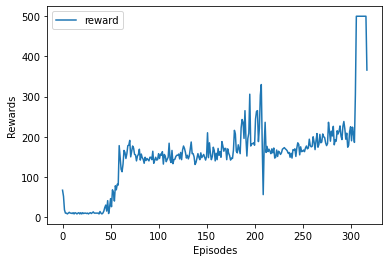

In [16]:
plt.plot(fit_log.history['episode_reward'], label='reward')
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.legend()
plt.show()

#### Finally, evaluate the model  

In [17]:
%%time

n_trials = 5
view = ViewLogger()
test_log = dqn.test(env, nb_episodes=n_trials, visualize=False, callbacks=[view])

Testing for 5 episodes ...
Episode 1: reward: 249.000, steps: 249
Episode 2: reward: 305.000, steps: 305
Episode 3: reward: 253.000, steps: 253
Episode 4: reward: 296.000, steps: 296
Episode 5: reward: 297.000, steps: 297
CPU times: user 4.27 s, sys: 762 ms, total: 5.03 s
Wall time: 23.3 s


#### Show the animation for test  

Saving images into an animation gif file ...
0f 0.00048560698827107747m
0f 0.0005317568778991699m
200f 0.0893145203590393m
400f 0.18637521266937257m
600f 0.28359724283218385m
800f 0.3779969811439514m
1000f 0.4779349525769552m
1200f 0.5779712438583374m
Done.
0f 0.8135726014773051m
0f 0.8136490980784098m
200f 0.9292451103528341m
400f 1.0461421211560566m
600f 1.162931005160014m
800f 1.2803115685780844m
1000f 1.396744398276011m
1200f 1.5150660117467245m
CPU times: user 1min 37s, sys: 351 ms, total: 1min 37s
Wall time: 1min 38s


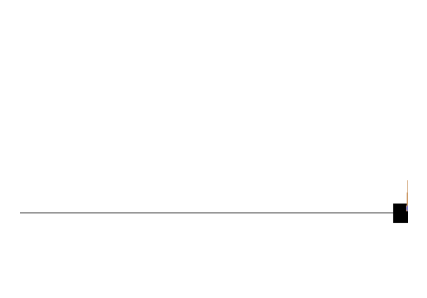

In [18]:
%%time

ret = view.view(interval=10)

In [19]:
HTML(ret)  # should be placed in another cell

In [20]:
env.close()